# Economic Data Analysis

In [125]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

In [2]:
!pip install fredapi

### fredapi is a Python API for the FRED data provided by the Federal Reserve Bank of St. Louis. fredapi provides a wrapper in python to the FRED web service, and also provides several conveninent methods for parsing and analyzing point-in-time data (i.e. historic data revisions) from ALFRED

###  fredapi makes use of pandas and returns data to you in a pandas Series or DataFrame

In [7]:
from fredapi import Fred
fred_key = 'e3e06bf53738d9bf05381cabad3c40e6'

# 1. Create the Fred Object

In [8]:
fred = Fred(api_key=fred_key)

# 2. Search for economic data!

In [13]:
sp_search = fred.search('S&P',order_by = 'popularity')

In [14]:
sp_search.shape

(1000, 15)

In [16]:
sp_search.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2023-08-19,2023-08-19,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2023-08-17,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2023-08-18 09:28:12-05:00,94,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2023-08-19,2023-08-19,S&P/Case-Shiller U.S. National Home Price Index,1987-01-01,2023-05-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2023-07-25 08:11:01-05:00,89,"For more information regarding the index, plea..."
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2023-08-19,2023-08-19,ICE BofA US High Yield Index Effective Yield,1996-12-31,2023-08-17,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2023-08-18 09:28:16-05:00,83,This data represents the effective yield of th...
SP500,SP500,2023-08-19,2023-08-19,S&P 500,2013-08-19,2023-08-18,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2023-08-18 19:13:26-05:00,82,The observations for the S&P 500 represent the...
MEHOINUSA672N,MEHOINUSA672N,2023-08-19,2023-08-19,Real Median Household Income in the United States,1984-01-01,2021-01-01,Annual,A,2021 CPI-U-RS Adjusted Dollars,2021 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2022-09-13 13:48:01-05:00,80,Household data are collected as of March. As ...


# Pull Raw Data and Plot


<Axes: title={'center': 'S&P 500'}>

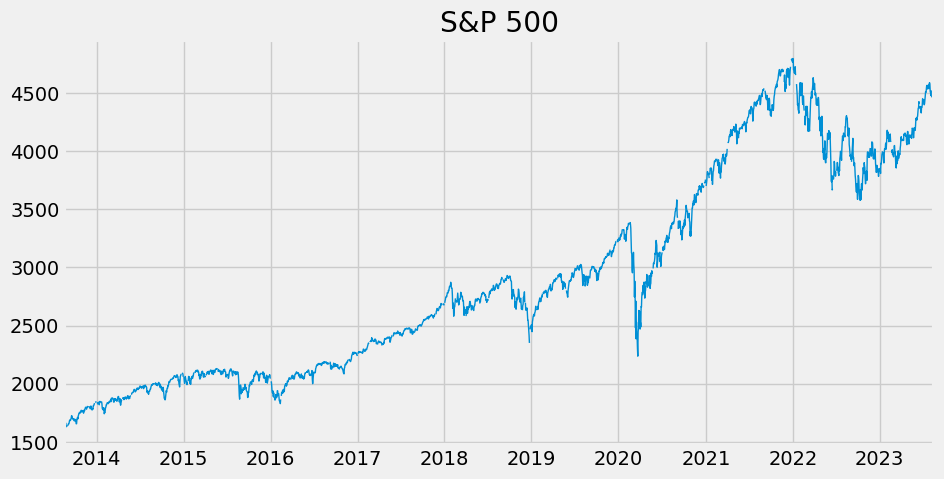

In [22]:
sp500 = fred.get_series(series_id='SP500')
sp500.plot(figsize=(10,5),title='S&P 500',lw=1)

#  4. Pull and Join Multiple Data Series

In [162]:
unemp_results=fred.search('unemployment')

In [163]:
unrate=fred.get_series('UNRATE')

In [164]:
unemp_results

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2023-08-19,2023-08-19,Unemployment Rate,1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:03-05:00,92,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2023-08-19,2023-08-19,Unemployment Rate,1948-01-01,2023-07-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2023-08-04 07:45:34-05:00,53,The unemployment rate represents the number of...
CCSA,CCSA,2023-08-19,2023-08-19,Continued Claims (Insured Unemployment),1967-01-07,2023-08-05,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2023-08-17 07:33:03-05:00,74,"Continued claims, also referred to as insured ..."
CCNSA,CCNSA,2023-08-19,2023-08-19,Continued Claims (Insured Unemployment),1967-01-07,2023-08-05,"Weekly, Ending Saturday",W,Number,Number,Not Seasonally Adjusted,NSA,2023-08-17 07:33:03-05:00,39,"Continued claims, also referred to as insured ..."
NROU,NROU,2023-08-19,2023-08-19,Noncyclical Rate of Unemployment,1949-01-01,2025-10-01,Quarterly,Q,Percent,%,Not Seasonally Adjusted,NSA,2023-08-01 11:01:03-05:00,63,"Starting with the July, 2021 report: An Update..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LNS14000013,LNS14000013,2023-08-19,2023-08-19,"Unemployment Rate - 16-19 Yrs., Men",1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:47:28-05:00,3,The series comes from the 'Current Population ...
LRHUTTTTFIM156S,LRHUTTTTFIM156S,2023-08-19,2023-08-19,Harmonised Unemployment - Monthly Rates: Total...,1988-01-01,2023-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-10 16:01:55-05:00,2,OECD descriptor ID: LRHUTTTT OECD unit ID: STS...
WEIR239URN,WEIR239URN,2023-08-19,2023-08-19,"Unemployment Rate in Weirton-Steubenville, WV-...",1990-01-01,2023-06-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2023-08-02 10:09:28-05:00,2,None


<Axes: title={'center': 'UNRATE'}>

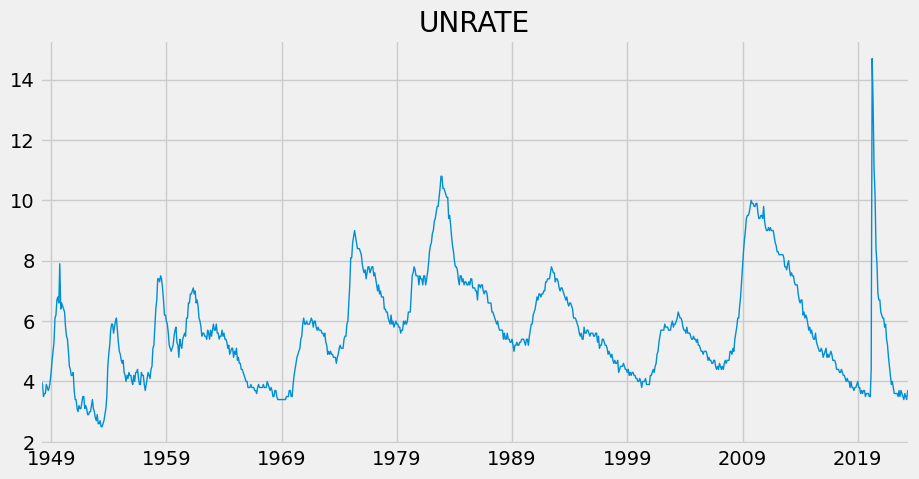

In [165]:
unrate.plot(figsize=(10,5),title='UNRATE',lw=1)

In [166]:
unemp_df = fred.search('unemployment rate state',filter=('frequency','Monthly'))

In [167]:
unemp_df=unemp_df.query('seasonal_adjustment=="Seasonally Adjusted" and units == "Percent"')

In [168]:
unemp_df=unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate')]

In [169]:
unemp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2023-08-19,2023-08-19,Unemployment Rate,1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:03-05:00,92,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2023-08-19,2023-08-19,Unemployment Rate - Black or African American,1972-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:23-05:00,67,The series comes from the 'Current Population ...
CAUR,CAUR,2023-08-19,2023-08-19,Unemployment Rate in California,1976-01-01,2023-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-07-26 14:43:01-05:00,57,None
M0892AUSM156SNBR,M0892AUSM156SNBR,2023-08-19,2023-08-19,Unemployment Rate for United States,1929-04-01,1942-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:26:06-05:00,48,Series Is Presented Here As Three Variables--(...
TXUR,TXUR,2023-08-19,2023-08-19,Unemployment Rate in Texas,1976-01-01,2023-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-07-26 14:42:02-05:00,50,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LNS14023557,LNS14023557,2023-08-19,2023-08-19,Unemployment Rate - Reentrants to Labor Force,1967-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:47:25-05:00,3,The series comes from the 'Current Population ...
LNS14023569,LNS14023569,2023-08-19,2023-08-19,Unemployment Rate - New Entrants,1967-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:47:25-05:00,3,The series comes from the 'Current Population ...
LRUN74TTUSM156S,LRUN74TTUSM156S,2023-08-19,2023-08-19,Unemployment Rate: Aged 15-74: All Persons for...,1981-01-01,2023-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-10 15:42:04-05:00,3,OECD descriptor ID: LRUN74TT OECD unit ID: STS...


In [170]:
unemp_df.index

Index(['UNRATE', 'LNS14000006', 'CAUR', 'M0892AUSM156SNBR', 'TXUR',
       'M0892BUSM156SNBR', 'FLUR', 'LNS14000031', 'NYUR', 'LNS14000024',
       ...
       'LNS14000089', 'LNS14000026', 'LNS14000061', 'LNS14000062',
       'LNS14000015', 'LNS14023557', 'LNS14023569', 'LRUN74TTUSM156S',
       'LRUN25FEUSM156S', 'LNS14000014'],
      dtype='object', name='series id', length=103)

In [171]:
all_results = []

for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
    

In [172]:
unemp_results=pd.concat(all_results,axis=1)

In [188]:
unemp_results

,UNRATE,LNS14000006,CAUR,M0892AUSM156SNBR,TXUR,M0892BUSM156SNBR,FLUR,LNS14000031,NYUR,LNS14000024,...,LNS14000089,LNS14000026,LNS14000061,LNS14000062,LNS14000015,LNS14023557,LNS14023569,LRUN74TTUSM156S,LRUN25FEUSM156S,LNS14000014
1929-04-01,NaN,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-01,3.5,5.0,4.4,NaN,4.0,NaN,2.6,5.2,4.1,3.2,...,3.8,3.1,3.0,2.8,8.5,1.0,0.3,3.545139,2.8,9.3
2023-04-01,3.4,4.7,4.5,NaN,4.0,NaN,2.6,4.5,4.0,3.2,...,3.8,3.1,3.1,3.0,8.7,1.1,0.3,3.430942,3.0,9.2
2023-05-01,3.7,5.6,4.5,NaN,4.1,NaN,2.6,5.6,3.9,3.4,...,3.9,3.3,3.1,3.2,9.1,1.1,0.3,3.571123,3.2,10.2
2023-06-01,3.6,6.0,4.6,NaN,4.1,NaN,2.6,5.9,3.9,3.3,...,3.9,3.1,3.0,3.2,9.7,1.0,0.3,3.553232,3.2,9.7


In [189]:
unemp_states = unemp_results.drop('UNRATE',axis=1)

In [190]:
unemp_states

,LNS14000006,CAUR,M0892AUSM156SNBR,TXUR,M0892BUSM156SNBR,FLUR,LNS14000031,NYUR,LNS14000024,LNS14000009,...,LNS14000089,LNS14000026,LNS14000061,LNS14000062,LNS14000015,LNS14023557,LNS14023569,LRUN74TTUSM156S,LRUN25FEUSM156S,LNS14000014
1929-04-01,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-01,5.0,4.4,NaN,4.0,NaN,2.6,5.2,4.1,3.2,4.6,...,3.8,3.1,3.0,2.8,8.5,1.0,0.3,3.545139,2.8,9.3
2023-04-01,4.7,4.5,NaN,4.0,NaN,2.6,4.5,4.0,3.2,4.4,...,3.8,3.1,3.1,3.0,8.7,1.1,0.3,3.430942,3.0,9.2
2023-05-01,5.6,4.5,NaN,4.1,NaN,2.6,5.6,3.9,3.4,4.0,...,3.9,3.3,3.1,3.2,9.1,1.1,0.3,3.571123,3.2,10.2
2023-06-01,6.0,4.6,NaN,4.1,NaN,2.6,5.9,3.9,3.3,4.3,...,3.9,3.1,3.0,3.2,9.7,1.0,0.3,3.553232,3.2,9.7


In [191]:
px.line(unemp_states)

## Pull Aprill 2020 Unemployment Rate per state

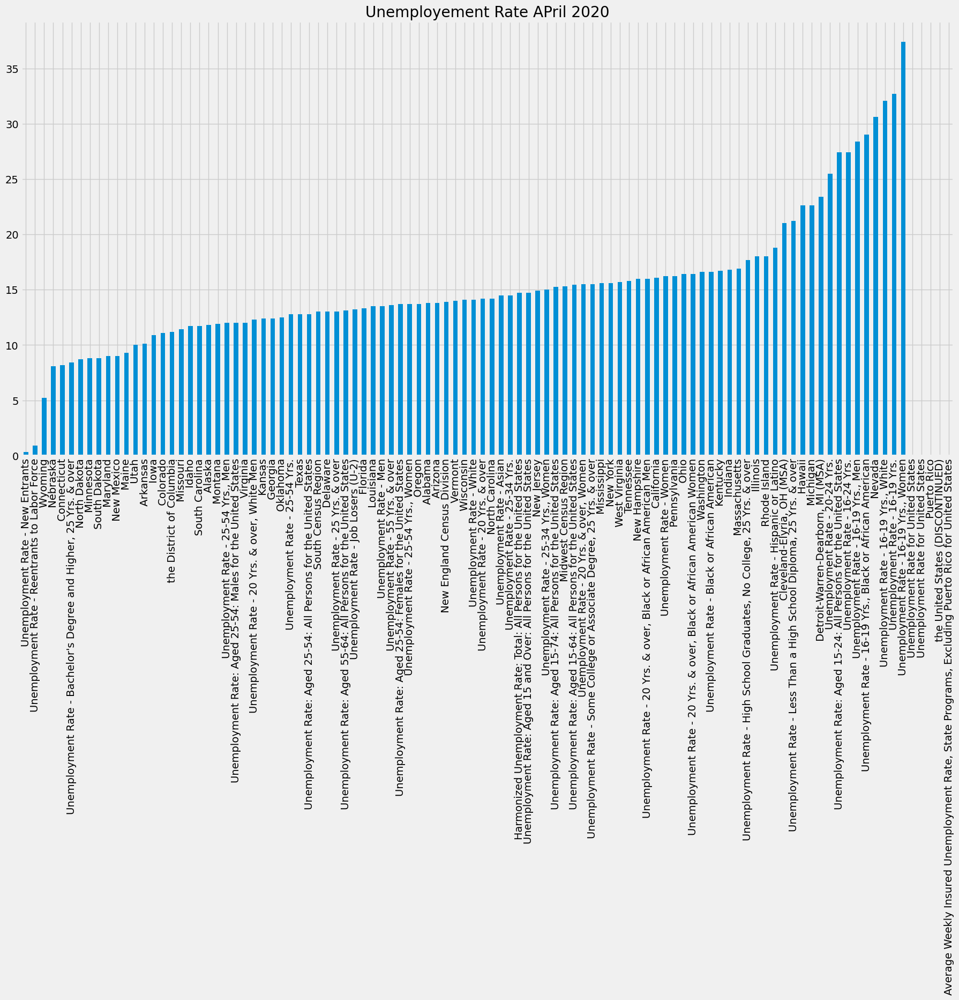

In [185]:
ax=unemp_states.loc[unemp_states.index=='2020-04-01'].T.sort_values('2020-04-01').plot(kind='bar',figsize=(20,10),title='Unemployement Rate APril 2020')
ax.legend().remove()
plt.show()

# Pull Participation Rate

In [194]:
part_df = fred.search('participation rate state', filter=('frequency','Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

In [195]:
part_df.shape

(109, 15)

In [196]:
part_df.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CIVPART,CIVPART,2023-08-19,2023-08-19,Labor Force Participation Rate,1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:21-05:00,83,The series comes from the 'Current Population ...
LNS11300060,LNS11300060,2023-08-19,2023-08-19,Labor Force Participation Rate - 25-54 Yrs.,1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:24-05:00,67,The series comes from the 'Current Population ...
LNS11300002,LNS11300002,2023-08-19,2023-08-19,Labor Force Participation Rate - Women,1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:32-05:00,63,To obtain estimates of women worker employment...
LNS11300001,LNS11300001,2023-08-19,2023-08-19,Labor Force Participation Rate - Men,1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:33-05:00,56,The series comes from the 'Current Population ...
LNS11324230,LNS11324230,2023-08-19,2023-08-19,Labor Force Participation Rate - 55 Yrs. & over,1948-01-01,2023-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-08-04 07:45:34-05:00,52,The series comes from the 'Current Population ...


In [198]:
id_to_state = part_df['title'].str.replace('Labor Force Participation Rate for ','').to_dict()

In [199]:
all_results = []

for myid in part_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
part_states = pd.concat(all_results,axis=1)
    

In [200]:
part_states.columns = [id_to_state[c] for c in part_states.columns]

In [201]:
part_states

,Labor Force Participation Rate,Labor Force Participation Rate - 25-54 Yrs.,Labor Force Participation Rate - Women,Labor Force Participation Rate - Men,Labor Force Participation Rate - 55 Yrs. & over,Labor Force Participation Rate - 16-19 Yrs.,Labor Force Participation Rate - 20-24 Yrs.,Labor Force Participation Rate - Black or African American,Activity Rate: Aged 25-54: Males for the United States,Alabama,...,Inactivity Rate: Aged 25-54: All Persons for the United States,Inactivity Rate: Aged 15 and Over: Females for the United States,Activity Rate: Aged 15 and Over: Males for the United States,Inactivity Rate: Aged 15 and Over: Males for the United States,Activity Rate: Aged 15 and Over: Females for the United States,Inactivity Rate: Aged 15-24: All Persons for the United States,Inactivity Rate: Aged 15 and Over: All Persons for the United States,Activity Rate: Aged 15 and Over: All Persons for the United States,Inactivity Rate: Aged 15-64: Females for the United States,Inactivity Rate: Aged 15-74: All Persons for the United States
1948-01-01,58.6,64.2,32.0,86.7,43.0,53.2,64.4,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-02-01,58.9,64.6,32.4,87.0,43.3,53.7,64.9,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-03-01,58.5,64.3,32.1,86.3,43.0,54.1,63.3,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-04-01,59.0,64.8,33.0,86.6,43.4,54.2,63.7,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-05-01,58.3,64.3,32.0,86.1,43.2,50.9,63.7,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-01,62.6,83.1,57.1,68.4,38.6,37.4,72.0,64.1,89.1,56.7,...,16.832002,42.895344,68.4,31.618133,57.1,43.185638,37.383202,62.6,30.443857,32.092319
2023-04-01,62.6,83.3,57.3,68.1,38.4,37.1,70.9,63.0,89.2,56.8,...,16.680719,42.733593,68.1,31.902575,57.3,43.768637,37.439527,62.6,30.255401,32.129475
2023-05-01,62.6,83.4,57.3,68.1,38.4,36.8,71.5,63.2,89.1,56.9,...,16.670055,42.689235,68.1,31.933702,57.3,43.746889,37.431831,62.6,30.111859,32.121312
2023-06-01,62.6,83.5,57.3,68.1,38.3,36.3,71.0,62.6,89.2,57.0,...,16.615836,42.727579,68.1,31.878412,57.3,44.118067,37.424897,62.6,30.059394,32.089733


In [203]:
px.line(part_states)